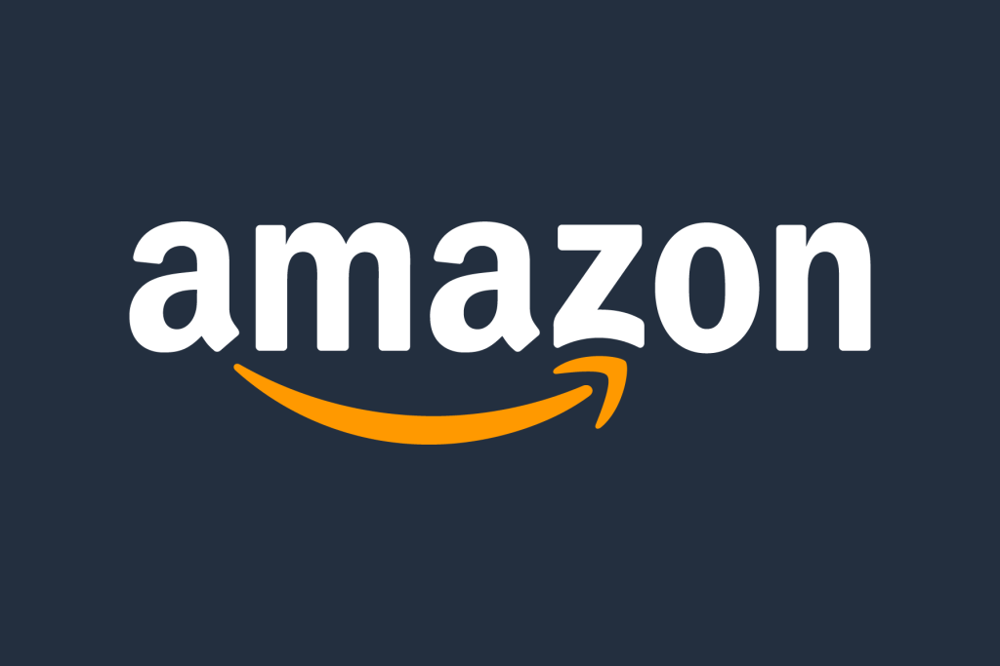

In [1]:
from IPython.display import Image
Image(filename=r'D:\Ammar\AMIT Diploma\Machine Leaning\session7\amazon-logo-1024x683.png')

<div class="alert alert-block alert-success">
    <h1> 1-Understand the data :</h1>
    
- Upload the data and take a look of columns and data types
- Identfy the target Label
    
</div>

## Import Libraries

In [2]:
# Importing Basic Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random as rd
import warnings
import plotly.express as px
import plotly.io as pio
warnings.filterwarnings('ignore')

# Importing Machine Learning Library
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split, GridSearchCV
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

In [3]:
df=pd.read_csv(r'D:\Ammar\AMIT Diploma\Machine Leaning\session7\21-Appliances.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23084 entries, 0 to 23083
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   brandId                      23084 non-null  int64  
 1   subcategoryId                22316 non-null  float64
 2   imageUrl                     20675 non-null  object 
 3   asin                         23084 non-null  object 
 4   title                        23084 non-null  object 
 5   brandName                    22977 non-null  object 
 6   categoryId                   23084 non-null  int64  
 7   subcategory.subcategoryName  22287 non-null  object 
 8   rank                         21335 non-null  float64
 9   amazonIsr                    23084 non-null  float64
 10  numberOfSellers              23084 non-null  int64  
 11  isVariation                  23084 non-null  bool   
 12  monthlyRevenueEstimate       9860 non-null   float64
 13  ttm             

### Data Card:
- **brand_id:** unique number for products
- **category_id:** unique number for each category
- **sub_category_id:** unique number for each sub category
- **sub_category_name**: Name of sub category
- **ASIN:** Standard Identification Number, is a unique block of 10 characters
- **title:** Name of the product
- **brand_Name:** brand name 
- **rank:** Amazon sales rank, shows how well a product is selling in its respective category
- **amazon_Isr:** Inside Sales Representative
- **number_Of_Sellers:** number Of Sellers in Amazon
- **is_Variation:** different product options available for sale under one listing
- **monthly_Revenue_Estimate:** target column
- **TTM**: trailing twelve month (TTM) Revenue
- **number_FBA_sellers :**  for third-party sellers to automate their order fulfillment and shipping services
- **monthly_Units_Sold:** descripe how much units are sold per month
- **listed_Since:** Describe the date when the products are listed on Amazon.
- **review_Count:** Review count on Amazon refers to the total number of reviews a product has received from customers.
- **review_Rating:** In Amazon, a review rating is a star value assigned by customers to a product, ranging from one to five stars. 
- **number_FBA_sellers:** Fulfillment by Amazon (FBA) is a program that lets you outsource order fulfillment to Amazon.
- **buy_Box_Price:** The Amazon Buy Box refers to a box that appears on the right-hand side of product listings. It features the product's price, shipping, and seller information, as well as the, “Add to Cart,” button.
- **avg_Buy_Box_Price:** average of the box price.
- **buy_Box_Equity:** is an ownership stake in Amazon that some sellers hold.
- **revenue_Equity:** Find out all the key statistics for Amazon.com, Inc. (AMZN), including valuation, measures, fiscal year financial statistics, trading record, ...
- **out_Of_Stock_Now:** not in stock or available; not available to buy (because all have already been bought.
- **product_Page_Score:** Listing quality analysis is an extremely important component for any seller on Amazon.
- **manufacturer:** The product manufacturer in amazon.
- **UPC:** Universal Product Codes (UPC) is a 12-digit barcode used by most retailers in AMAZON.
- **part_Number:** Amazon uses manufacturer part numbers as one of several kinds of unique identifiers.
- **model:** the way of selling products on Amazon's online marketplace.
- **number_Of_Items:** products listed on the marketplace.
- **total_Ratings:**  a system where customers can rate and review their experiences with third-party sellers on Amazon.
- **mom_Growth:**  MoM (Month-over-Month) growth in Amazon refers to the measurement of growth change in metrics such as sales, order volume, or revenue from one month to the next. It's an important performance indicator that helps businesses.
- **mom_Growth12:** same as mom_growth but annauly, 12 indicates to 12 months.
- **note:** "Notes for You" is a feature on some devices that allows users to send notes to others in their home, requiring visual and voice ID for functionality.


## Data Size
- Indicates the data size in terms of columns and rows.
- The shape function returns the number of columns and rows.

In [5]:
df.shape

(23084, 35)

## Data Preview: 
- This step allows us to examine the data's appearance.
- `head()` shows the first few rows of the dataset.
- `sample()` displays a random sample from the dataset.

In [6]:
df.head(7)

,brandId,subcategoryId,imageUrl,asin,title,brandName,categoryId,subcategory.subcategoryName,rank,amazonIsr,...,productPageScore,manufacturer,upc,partNumber,model,numberOfItems,totalRatings,momGrowth,momGrowth12,note
0,181347,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B09ZRNP19N,GE Profile Opal 1.0 Nugget Ice Maker| Countert...,GE PROFILE,21,Ice Makers,NaN,0.0,...,9.2,GE Profile,8.469190e+10,P4INAASSTSS,P4INAASSTSS,1,0.0,-0.770,NaN,NaN
1,297220,3.741161e+06,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0C7M5MKDQ,Maxblue RPWFE (with CHIP) NSF 401 Certified Re...,Maxblue,21,Water Filters,NaN,0.0,...,7.2,Maxblue,NaN,MB-F19C-D,MB-F19C-D,1,NaN,NaN,NaN,NaN
2,12164,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0BTHNM6V7,"AGLUCKY Ice Makers Countertop, 9 Cubes in 6 Mi...",AGLUCKY,21,Ice Makers,3.0,0.0,...,9.1,AGLUCKY,NaN,FBA-Z5878-GREEN,NaN,1,NaN,0.000,NaN,NaN
3,138140,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0BV9Z8ZFV,EUHOMY Countertop Ice Maker Machine with Handl...,E EUHOMY,21,Ice Makers,6.0,0.0,...,9.0,E EUHOMY,1.968528e+11,HZB-12H,IM-06S-HM,1,NaN,-0.660,NaN,NaN
4,138140,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0BWHZJHPL,EUHOMY Countertop Ice Maker Machine with Handl...,E EUHOMY,21,Ice Makers,NaN,0.0,...,9.0,E EUHOMY,1.976442e+11,IM-06D-HM,IM-06D-HM,1,NaN,-0.138,NaN,NaN
5,12164,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B07NVDFKH8,"AGLUCKY Countertop Ice Maker Machine, Portable...",AGLUCKY,21,Ice Makers,2.0,0.0,...,9.5,AGLUCKY,6.158559e+11,5812BS,Z5879-GREY,1,6706.0,-0.053,0.321,NaN
6,12164,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B08FZYMWJT,"AGLUCKY Countertop Ice Maker Machine, Portable...",AGLUCKY,21,Ice Makers,3.0,0.0,...,9.5,AGLUCKY,6.649184e+11,58,Z5876-BLACK,1,3415.0,-0.053,0.314,NaN


In [7]:
df.sample(7)

,brandId,subcategoryId,imageUrl,asin,title,brandName,categoryId,subcategory.subcategoryName,rank,amazonIsr,...,productPageScore,manufacturer,upc,partNumber,model,numberOfItems,totalRatings,momGrowth,momGrowth12,note
2725,268976,9.709422e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B09SH5SDJX,"LDAILY Portable Washing Machine, 26 lbs Capaci...",LDAILY,21,Portable Washers,3254.0,0.0,...,8.3,LDAILY,6.085649e+11,FP10093US,NaN,1,0.0,-0.375,7.068,NaN
6364,1874101,9.709422e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0BYT9VJLT,Portable Washing Machine Mini Foldable Small M...,GDEOUP,21,Portable Washers,1085.0,0.0,...,7.4,HomeCJY,7.627043e+11,CLY001,CLY-001,1,NaN,15.218,NaN,NaN
11319,763978,3.741261e+06,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B09K3NK376,Futchoy 5 Burners Gas Stove For Kitchen Equipm...,Futchoy,21,Cooktops,12297.0,0.0,...,6.8,Royan-LMJ,NaN,HG-HSP,NaN,1,NaN,NaN,NaN,NaN
15048,2249047,7.390202e+10,NaN,B09PFY121C,Washing Machine Pressure Water Level Switch co...,?HUIWI,21,Appliances,14859.0,0.0,...,2.9,?HUIWI,7.263846e+11,WH12X10530,NaN,1,NaN,NaN,NaN,NaN
2344,225942,2.399939e+09,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0B22PSR1B,Igloo 26-Pound Automatic Self-Cleaning Portabl...,Igloo,21,Ice Makers,NaN,0.0,...,9.8,Igloo,8.100617e+11,IGLICEB26HNPK,IGLICEB26HNPK,1,NaN,0.791,NaN,NaN
21531,101793,7.390202e+10,NaN,B0876BTSX2,Tempered glass wall panel with metal backing F...,Concept Crystal,21,Appliances,15655.0,0.0,...,2.7,Concept Crystal,NaN,MetalBigsplashback05,NaN,1,0.0,NaN,NaN,NaN
2181,995811,3.741441e+06,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",B0B6ZW7RKJ,JOEAONZ Island Range Hood 30 Inch Ceiling Moun...,JOEAONZ,21,Range Hoods,474.0,0.0,...,8.2,JOEAONZ,NaN,YYF0275B-S,NaN,1,1.0,-0.260,NaN,NaN


## Data Types:
- Use `info()` to get dataset details.
- Use dtypes to determine each column's data type.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23084 entries, 0 to 23083
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   brandId                      23084 non-null  int64  
 1   subcategoryId                22316 non-null  float64
 2   imageUrl                     20675 non-null  object 
 3   asin                         23084 non-null  object 
 4   title                        23084 non-null  object 
 5   brandName                    22977 non-null  object 
 6   categoryId                   23084 non-null  int64  
 7   subcategory.subcategoryName  22287 non-null  object 
 8   rank                         21335 non-null  float64
 9   amazonIsr                    23084 non-null  float64
 10  numberOfSellers              23084 non-null  int64  
 11  isVariation                  23084 non-null  bool   
 12  monthlyRevenueEstimate       9860 non-null   float64
 13  ttm             

In [9]:
df.dtypes

brandId                          int64
subcategoryId                  float64
imageUrl                        object
asin                            object
title                           object
brandName                       object
categoryId                       int64
subcategory.subcategoryName     object
rank                           float64
amazonIsr                      float64
numberOfSellers                  int64
isVariation                       bool
monthlyRevenueEstimate         float64
ttm                            float64
monthlyUnitsSold               float64
listedSince                     object
reviewCount                      int64
reviewRating                   float64
numberFbaSellers                 int64
buyBoxPrice                    float64
averageBuyBoxPrice             float64
buyBoxEquity                   float64
revenueEquity                  float64
marginEquity                   float64
outOfStockNow                     bool
productPageScore         

- We can drop the imageUrl column as it does not affect the target column.
- There are null values the data should be handeld.
- The object data type should be converted to category for better handling.
- We should also apply label encoding to these categorical data.

In [10]:
df.drop('imageUrl',axis=1,inplace=True)

- Modifiy column names for a more formal presentation.

In [11]:
df.columns = ['brand_id', 'sub_category_id', 'ASIN', 'title', 'brand_Name', 'category_id',
       'sub_category_name', 'rank', 'amazon_Isr', 'number_Of_Sellers',
       'is_Variation', 'monthly_Revenue_Estimate', 'TTM', 'monthly_Units_Sold',
       'listed_Since', 'review_Count', 'review_Rating', 'number_FBA_sellers',
       'buy_Box_Price', 'avg_Buy_Box_Price', 'buy_Box_Equity', 'revenue_Equity',
       'margin_Equity', 'out_Of_Stock_Now', 'product_Page_Score', 'manufacturer',
       'UPC', 'part_Number', 'model', 'number_Of_Items', 'total_Ratings',
       'mom_Growth', 'mom_Growth12', 'note']

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23084 entries, 0 to 23083
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   brand_id                  23084 non-null  int64  
 1   sub_category_id           22316 non-null  float64
 2   ASIN                      23084 non-null  object 
 3   title                     23084 non-null  object 
 4   brand_Name                22977 non-null  object 
 5   category_id               23084 non-null  int64  
 6   sub_category_name         22287 non-null  object 
 7   rank                      21335 non-null  float64
 8   amazon_Isr                23084 non-null  float64
 9   number_Of_Sellers         23084 non-null  int64  
 10  is_Variation              23084 non-null  bool   
 11  monthly_Revenue_Estimate  9860 non-null   float64
 12  TTM                       12214 non-null  float64
 13  monthly_Units_Sold        9882 non-null   float64
 14  listed

- Change In-correct Datatypes

In [13]:
cols=['ASIN','title','brand_Name','sub_category_name','listed_Since','manufacturer','part_Number','model']                    
df[cols] = df[cols].astype('category')
pd.DataFrame(df.dtypes).T            


,brand_id,sub_category_id,ASIN,title,brand_Name,category_id,sub_category_name,rank,amazon_Isr,number_Of_Sellers,...,product_Page_Score,manufacturer,UPC,part_Number,model,number_Of_Items,total_Ratings,mom_Growth,mom_Growth12,note
0,int64,float64,category,category,category,int64,category,float64,float64,int64,...,float64,category,float64,category,category,int64,float64,float64,float64,float64


## Missing Values:
- Check for nulls or missing values.
- Use `isnull().sum()` to get the total number of missing values per column.

In [14]:
df.isnull().sum()

brand_id                        0
sub_category_id               768
ASIN                            0
title                           0
brand_Name                    107
category_id                     0
sub_category_name             797
rank                         1749
amazon_Isr                      0
number_Of_Sellers               0
is_Variation                    0
monthly_Revenue_Estimate    13224
TTM                         10870
monthly_Units_Sold          13202
listed_Since                   63
review_Count                    0
review_Rating                8320
number_FBA_sellers              0
buy_Box_Price                 947
avg_Buy_Box_Price             732
buy_Box_Equity              16684
revenue_Equity              16687
margin_Equity               16687
out_Of_Stock_Now                0
product_Page_Score              0
manufacturer                 1978
UPC                         10552
part_Number                  3735
model                       10481
number_Of_Item

### Ratio of nulls to the original data:

In [15]:
nulls=df.isnull().sum()
ratio=(nulls/df.shape[0])*100
ratio

brand_id                      0.000000
sub_category_id               3.326980
ASIN                          0.000000
title                         0.000000
brand_Name                    0.463525
category_id                   0.000000
sub_category_name             3.452608
rank                          7.576676
amazon_Isr                    0.000000
number_Of_Sellers             0.000000
is_Variation                  0.000000
monthly_Revenue_Estimate     57.286432
TTM                          47.088893
monthly_Units_Sold           57.191128
listed_Since                  0.272916
review_Count                  0.000000
review_Rating                36.042280
number_FBA_sellers            0.000000
buy_Box_Price                 4.102409
avg_Buy_Box_Price             3.171028
buy_Box_Equity               72.275169
revenue_Equity               72.288165
margin_Equity                72.288165
out_Of_Stock_Now              0.000000
product_Page_Score            0.000000
manufacturer             

**Fill nulls:** Columns with a small percentage of missing values:
- `brand_Name` (0.46%)
- `sub_category_name` (3.45%)
- `buy_Box_Price` (4.10%)
- `avg_Buy_Box_Price` (3.17%)
- `listed_Since` (0.27%)
- `monthly_Revenue_Estimate` (57.29%)
- `TTM`(47.09%)
- `monthly_Units_Sold` (57.19%)
- `review_Rating` (36.04%) 
- `manufacturer` (8.57%) 
- `UPC` (45.71%)
- `part_Number` (16.18%) 
- `model` (45.40%)
- `total_Ratings` (51.11%)
- `sub_category_id` (3.32%)
- `rank`(7.57%)


**Drop:** Columns with a high percentage of missing values, where there's no additional value or potential harm to the model if you attempt to impute the values:
- `mom_Growth` (65.00%)
- ` mom_Growth12` (62.45%)
- `note (100.00%)` (100%)
- `buy_Box_Equity`(72.27%)
- `revenue_Equity`(72.28%)
- `margin_Equity`(72.28%)

In [16]:
# columns to fill
df['brand_Name'].fillna(df['brand_Name'].mode()[0], inplace=True) 
df['sub_category_name'].fillna(df['sub_category_name'].mode()[0], inplace=True)
df['buy_Box_Price'].fillna(df['buy_Box_Price'].mean(), inplace=True)
df['avg_Buy_Box_Price'].fillna(df['avg_Buy_Box_Price'].mean(), inplace=True)
df['listed_Since'].fillna(df['listed_Since'].mode()[0], inplace=True)
df['monthly_Revenue_Estimate'].fillna(df['monthly_Revenue_Estimate'].mean(),inplace=True)
df['TTM'].fillna(df['TTM'].mean(),inplace=True)
df['monthly_Units_Sold'].fillna(df['monthly_Units_Sold'].mean(),inplace=True)
df['review_Rating'].fillna(df['review_Rating'].mean(),inplace=True)
df['manufacturer'].fillna(df['manufacturer'].mode()[0],inplace=True)
df['UPC'].fillna(df['UPC'].mean(),inplace=True)
df['part_Number'].fillna(df['part_Number'].mode()[0],inplace=True)
df['model'].fillna(df['model'].mode()[0],inplace=True)
df['total_Ratings'].fillna(df['total_Ratings'].mean(),inplace=True)
df['sub_category_id'].fillna(df['sub_category_id'].mean(),inplace=True)
df['rank'].fillna(df['rank'].mean(),inplace=True)



#columns to drop
cols_to_drop=['mom_Growth','mom_Growth12','note','buy_Box_Equity','revenue_Equity','margin_Equity']
df.drop(columns=cols_to_drop,axis=1,inplace=True)

- Ensure Missing values are removed successfully

In [17]:
df.isnull().sum()

brand_id                    0
sub_category_id             0
ASIN                        0
title                       0
brand_Name                  0
category_id                 0
sub_category_name           0
rank                        0
amazon_Isr                  0
number_Of_Sellers           0
is_Variation                0
monthly_Revenue_Estimate    0
TTM                         0
monthly_Units_Sold          0
listed_Since                0
review_Count                0
review_Rating               0
number_FBA_sellers          0
buy_Box_Price               0
avg_Buy_Box_Price           0
out_Of_Stock_Now            0
product_Page_Score          0
manufacturer                0
UPC                         0
part_Number                 0
model                       0
number_Of_Items             0
total_Ratings               0
dtype: int64

- Convert text to numbers for analysis.
- I prefer to create new columns for label encoding to retain the original text for visualization purposes.

In [18]:
from sklearn.preprocessing import LabelEncoder
cols=['ASIN','title','brand_Name','sub_category_name','listed_Since','manufacturer','part_Number','model']
le = LabelEncoder()
for col in cols:
  df[col + '_encoded'] = le.fit_transform(df[col])

df.head()

,brand_id,sub_category_id,ASIN,title,brand_Name,category_id,sub_category_name,rank,amazon_Isr,number_Of_Sellers,...,number_Of_Items,total_Ratings,ASIN_encoded,title_encoded,brand_Name_encoded,sub_category_name_encoded,listed_Since_encoded,manufacturer_encoded,part_Number_encoded,model_encoded
0,181347,2.399939e+09,B09ZRNP19N,GE Profile Opal 1.0 Nugget Ice Maker| Countert...,GE PROFILE,21,Ice Makers,12502.081837,0.0,1,...,1,0.000000,16903,7255,1094,112,2419,1091,10436,7930
1,297220,3.741161e+06,B0C7M5MKDQ,Maxblue RPWFE (with CHIP) NSF 401 Certified Re...,Maxblue,21,Water Filters,12502.081837,0.0,1,...,1,41.591529,22901,10722,1876,206,2814,1867,9878,7612
2,12164,2.399939e+09,B0BTHNM6V7,"AGLUCKY Ice Makers Countertop, 9 Cubes in 6 Mi...",AGLUCKY,21,Ice Makers,3.000000,0.0,1,...,1,41.591529,20380,1367,158,112,2685,164,5706,65
3,138140,2.399939e+09,B0BV9Z8ZFV,EUHOMY Countertop Ice Maker Machine with Handl...,E EUHOMY,21,Ice Makers,6.000000,0.0,1,...,1,41.591529,20515,5137,810,112,2694,805,8264,6659
4,138140,2.399939e+09,B0BWHZJHPL,EUHOMY Countertop Ice Maker Machine with Handl...,E EUHOMY,21,Ice Makers,12502.081837,0.0,1,...,1,41.591529,20770,5136,810,112,2707,805,8568,6658


## Statistical Overview
- Obtain statistical measures of the data.
- The `describe()` function provides statistical measures for each column.

In [19]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
brand_id,23084.0,6.058416e+05,5.855015e+05,72.00,1.813020e+05,4.198560e+05,8.362222e+05,2.337527e+06
sub_category_id,23084.0,9.442684e+09,2.194890e+10,289732.00,3.741361e+06,3.741441e+06,2.636227e+09,9.373917e+10
category_id,23084.0,2.100000e+01,0.000000e+00,21.00,2.100000e+01,2.100000e+01,2.100000e+01,2.100000e+01
rank,23084.0,1.250208e+04,4.970629e+04,1.00,2.894750e+03,8.063500e+03,1.330025e+04,1.686072e+06
amazon_Isr,23084.0,1.014122e-03,3.076531e-02,0.00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
number_Of_Sellers,23084.0,1.366184e+00,2.034082e+00,0.00,1.000000e+00,1.000000e+00,1.000000e+00,6.700000e+01
monthly_Revenue_Estimate,23084.0,6.176270e+03,2.309792e+04,0.00,2.863302e+03,6.176270e+03,6.176270e+03,3.223122e+06
TTM,23084.0,1.409050e+05,5.432020e+05,8.96,2.035748e+04,1.409050e+05,1.409050e+05,3.048675e+07
monthly_Units_Sold,23084.0,2.392815e+01,7.842426e+01,0.00,1.400000e+01,2.392815e+01,2.392815e+01,8.078000e+03
review_Count,23084.0,1.701140e+02,9.698841e+02,0.00,0.000000e+00,2.000000e+00,3.000000e+01,2.184500e+04


## Duplicated Data  
- Check for and remove duplicated values  
- Use `duplicated().sum()` to identify duplicates

In [20]:
df.duplicated().sum()

0

- No duplicated data

## Exploring Diversity:
- Determine the number of unique values in the dataset.
- Use `nunique()` to return the count of unique values.

In [21]:
df.nunique()

brand_id                      3201
sub_category_id                225
ASIN                         23084
title                        20712
brand_Name                    3252
category_id                      1
sub_category_name              208
rank                         11162
amazon_Isr                      12
number_Of_Sellers               42
is_Variation                     2
monthly_Revenue_Estimate      6479
TTM                          11710
monthly_Units_Sold             250
listed_Since                  2823
review_Count                   925
review_Rating                   41
number_FBA_sellers               7
buy_Box_Price                 7566
avg_Buy_Box_Price             8310
out_Of_Stock_Now                 2
product_Page_Score              96
manufacturer                  3314
UPC                          12507
part_Number                  15842
model                        11316
number_Of_Items                 26
total_Ratings                  511
ASIN_encoded        

## Correlation Analysis:
- Evaluate the correlation between features and the target label.
- Use `corr()` to compute the correlation matrix.

In [22]:
num_data=df.select_dtypes('number')
corr_matrix=num_data.corr()
corr_matrix

,brand_id,sub_category_id,category_id,rank,amazon_Isr,number_Of_Sellers,monthly_Revenue_Estimate,TTM,monthly_Units_Sold,review_Count,...,number_Of_Items,total_Ratings,ASIN_encoded,title_encoded,brand_Name_encoded,sub_category_name_encoded,listed_Since_encoded,manufacturer_encoded,part_Number_encoded,model_encoded
brand_id,1.000000,0.121186,NaN,-0.005654,-0.022197,-0.088197,-1.779110e-02,-2.744650e-02,-2.349758e-03,-0.081670,...,-5.446423e-03,-3.020249e-02,0.477027,0.157309,0.165730,-0.012691,0.433954,0.148084,-0.022740,-0.112258
sub_category_id,0.121186,1.000000,NaN,0.015275,-0.008334,-0.051120,-3.462320e-03,2.139647e-03,1.121215e-03,-0.046745,...,-2.830572e-03,-3.189313e-02,-0.004075,0.092927,-0.010875,-0.635733,0.028905,-0.034854,-0.033247,0.017108
category_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
rank,-0.005654,0.015275,NaN,1.000000,0.075042,-0.015026,-2.409238e-02,1.001785e-03,-2.670861e-02,-0.016504,...,5.202859e-05,-9.591649e-03,-0.028803,-0.055378,-0.069962,-0.096123,-0.043671,0.019384,-0.026541,-0.012626
amazon_Isr,-0.022197,-0.008334,NaN,0.075042,1.000000,0.016405,-6.152372e-03,-2.083785e-03,-6.835051e-03,0.000032,...,-2.169657e-04,-7.203472e-04,0.000840,-0.017993,-0.019874,-0.011060,-0.001046,-0.005684,-0.013174,-0.003762
number_Of_Sellers,-0.088197,-0.051120,NaN,-0.015026,0.016405,1.000000,2.265662e-02,7.352697e-02,1.692602e-02,0.189847,...,2.050961e-03,1.129344e-01,-0.238056,0.023134,0.001424,0.025785,-0.307680,-0.006287,0.025025,0.070054
monthly_Revenue_Estimate,-0.017791,-0.003462,NaN,-0.024092,-0.006152,0.022657,1.000000e+00,1.171741e-01,8.136103e-01,0.090442,...,-3.225791e-10,5.523044e-02,-0.007445,-0.009255,-0.012078,-0.009307,-0.010018,-0.012107,0.015353,0.027818
TTM,-0.027446,0.002140,NaN,0.001002,-0.002084,0.073527,1.171741e-01,1.000000e+00,1.754093e-01,0.363469,...,-8.688060e-10,2.810373e-01,-0.026582,-0.026916,-0.037305,-0.013508,-0.029101,-0.036723,0.005082,0.034851
monthly_Units_Sold,-0.002350,0.001121,NaN,-0.026709,-0.006835,0.016926,8.136103e-01,1.754093e-01,1.000000e+00,0.222667,...,4.398462e-09,1.486346e-01,0.026253,-0.020414,-0.021365,-0.001521,0.020201,-0.021756,0.010166,0.030474
review_Count,-0.081670,-0.046745,NaN,-0.016504,0.000032,0.189847,9.044163e-02,3.634694e-01,2.226673e-01,1.000000,...,-1.154450e-03,4.574255e-01,-0.058259,-0.050331,-0.059433,-0.005304,-0.081745,-0.044567,-0.011806,0.029848


In [23]:
target_corr = corr_matrix['monthly_Revenue_Estimate'].sort_values(ascending=False)
print("Correlation with target:\n", target_corr)

Correlation with target:
 monthly_Revenue_Estimate     1.000000e+00
monthly_Units_Sold           8.136103e-01
TTM                          1.171741e-01
review_Count                 9.044163e-02
total_Ratings                5.523044e-02
model_encoded                2.781761e-02
number_Of_Sellers            2.265662e-02
buy_Box_Price                2.263982e-02
avg_Buy_Box_Price            2.081356e-02
number_FBA_sellers           1.998987e-02
product_Page_Score           1.542733e-02
part_Number_encoded          1.535300e-02
review_Rating                1.792358e-03
number_Of_Items             -3.225791e-10
sub_category_id             -3.462320e-03
amazon_Isr                  -6.152372e-03
ASIN_encoded                -7.445465e-03
title_encoded               -9.254739e-03
sub_category_name_encoded   -9.307354e-03
listed_Since_encoded        -1.001826e-02
brand_Name_encoded          -1.207796e-02
manufacturer_encoded        -1.210722e-02
brand_id                    -1.779110e-02
rank    

### From Correlation Analysis:

drop the following cols: 
- **negative relationship:**
- `brand_id` -0.01779110
- `rank` -0.02409238
- `UPC` -0.04587156

- **weak relationship:**
- `model_encoded` 0.02781761
- `number_Of_Sellers` 0.02265662
- `buy_Box_Price` 0.02263982
- `avg_Buy_Box_Price` 0.02081356
- `number_FBA_sellers` 0.01998987
- `product_Page_Score` 0.01542733
- `part_Number_encoded` 0.01535300
- `review_Rating` 0.001792358
- `number_Of_Items` -0.0000000003225791
- `sub_category_id` -0.003462320
- `amazon_Isr` -0.006152372
- `ASIN_encoded` -0.007445465
- `title_encoded` -0.009254739
- `sub_category_name_encoded` -0.009307354
- `listed_Since_encoded` -0.01001826
- `brand_Name_encoded` -0.01207796
- `manufacturer_encoded`-0.01210722

- **No relationship:**
- `category_id` 0%



In [24]:
cols_to_drop=['brand_id','rank','UPC','model_encoded','model','number_Of_Sellers','buy_Box_Price','avg_Buy_Box_Price',
             'number_FBA_sellers','product_Page_Score','part_Number','part_Number_encoded','review_Rating','number_Of_Items',
             'sub_category_id','amazon_Isr','ASIN','ASIN_encoded','title','title_encoded','sub_category_name'
              ,'sub_category_name_encoded','listed_Since','listed_Since_encoded',
              'brand_Name','brand_Name_encoded','manufacturer','manufacturer_encoded'
             ,'category_id']
df.drop(columns=cols_to_drop,axis=1,inplace=True)
             

- Ensure columns are dropped successfully

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23084 entries, 0 to 23083
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   is_Variation              23084 non-null  bool   
 1   monthly_Revenue_Estimate  23084 non-null  float64
 2   TTM                       23084 non-null  float64
 3   monthly_Units_Sold        23084 non-null  float64
 4   review_Count              23084 non-null  int64  
 5   out_Of_Stock_Now          23084 non-null  bool   
 6   total_Ratings             23084 non-null  float64
dtypes: bool(2), float64(4), int64(1)
memory usage: 946.9 KB


# Heatmap:
- A heatmap visualizes the correlation matrix.

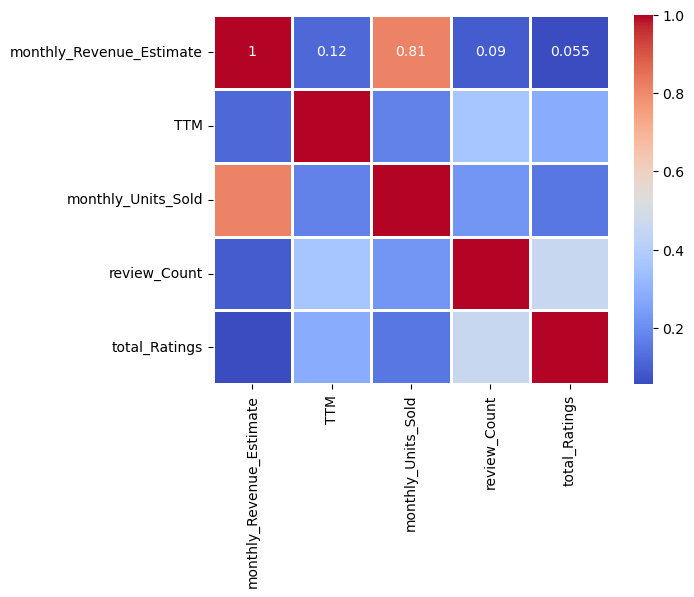

In [26]:
num_data=df.select_dtypes('number')
corr_matrix=num_data.corr()
sns.heatmap(corr_matrix,annot=True,linewidths=2,cmap='coolwarm')
plt.show()

# Outliers

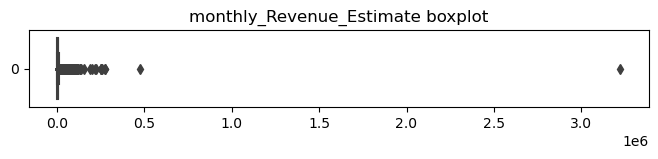

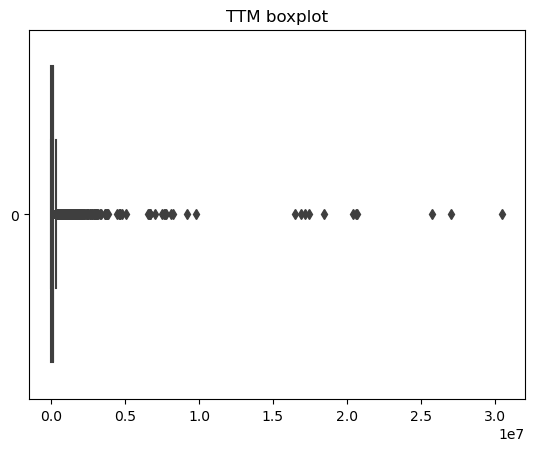

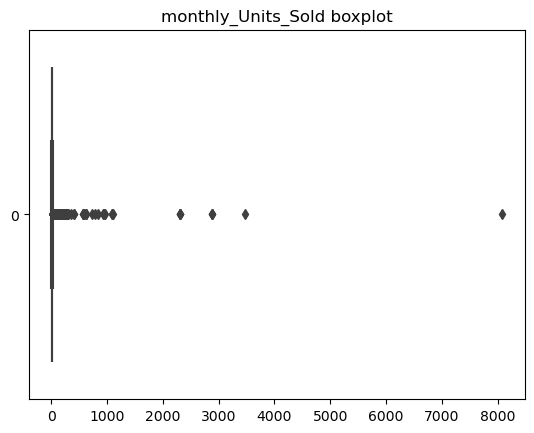

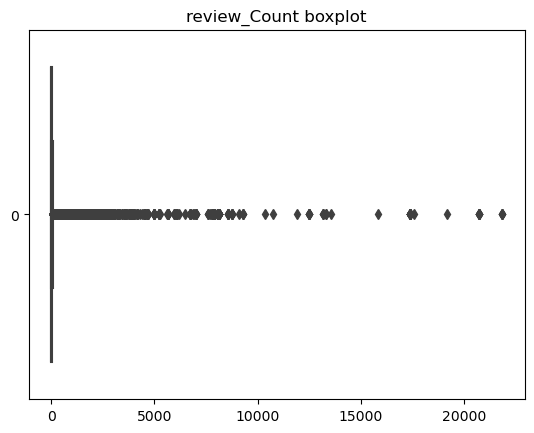

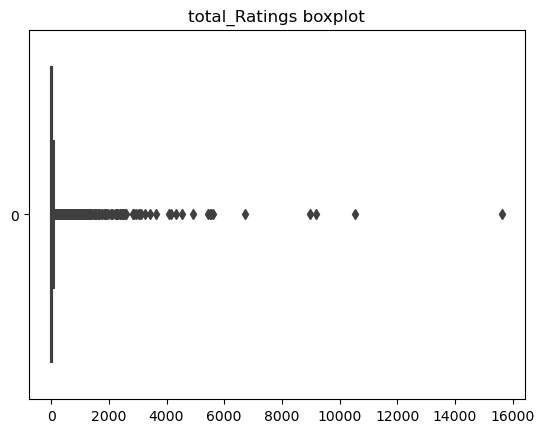

In [27]:
num_cols = df.select_dtypes("number").columns
plt.figure(figsize=(8, 1))
for col in num_cols:
    sns.boxplot(df[col], orient="h")
    plt.title(f"{col} boxplot")
    plt.show()

## Handle outliers


In [28]:
for col in num_cols:
    #Check to make sure the column is numeric
    if pd.api.types.is_numeric_dtype(df[col]):
        Q1 = df[col].quantile(.25)
        Q3 = df[col].quantile(.75)
        IQR = Q3 - Q1
        Lower_Fence = Q1 - 1.5 * IQR
        Upper_Fence = Q3 + 1.5 * IQR
        Lower_Outliers = df[df[col] < Lower_Fence][col].values
        Upper_Outliers = df[df[col] > Upper_Fence][col].values
        df[col].replace(Lower_Outliers, Lower_Fence, inplace=True)
        df[col].replace(Upper_Outliers, Upper_Fence, inplace=True)

- Ensure outliers are removed successfully

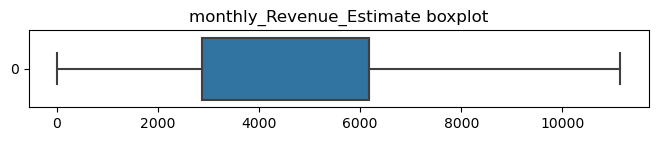

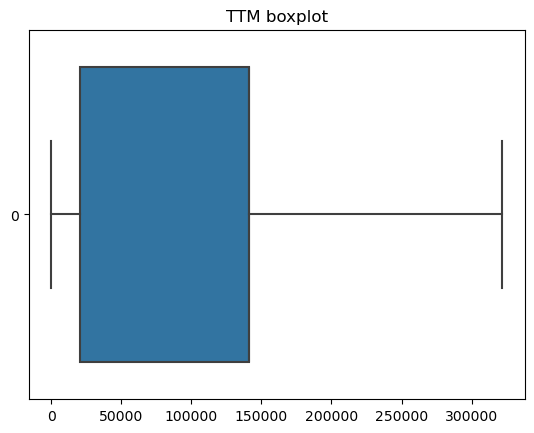

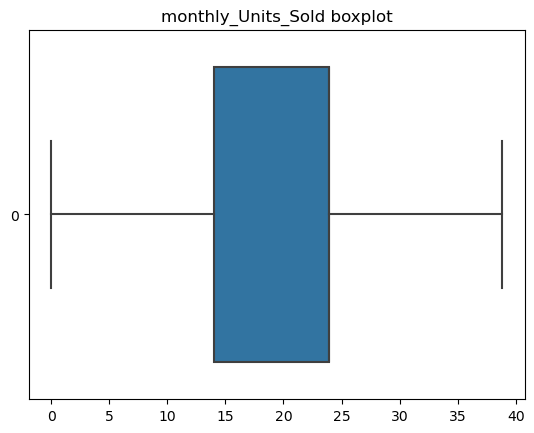

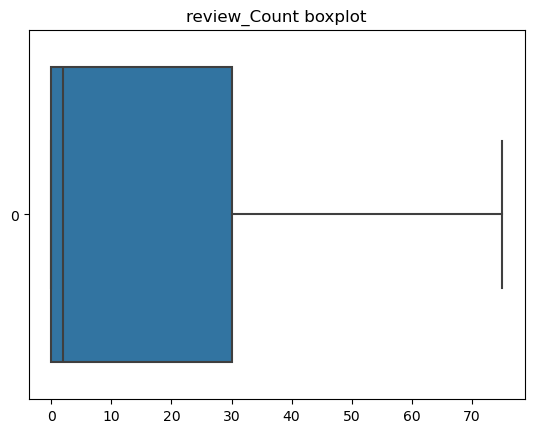

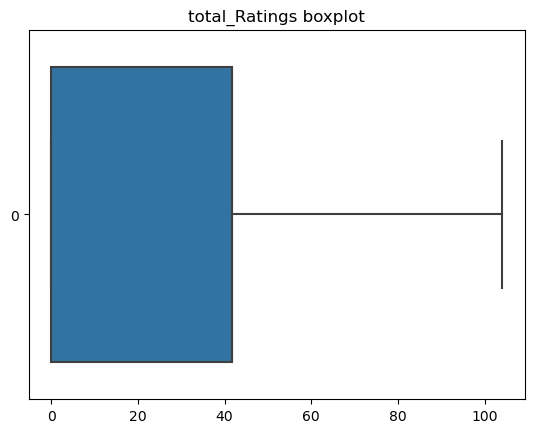

In [29]:
num_cols = df.select_dtypes("number").columns
plt.figure(figsize=(8, 1))
for col in num_cols:
    sns.boxplot(df[col], orient="h")
    plt.title(f"{col} boxplot")
    plt.show()

<div class="alert alert-block alert-info">
    <h1> 2-Visulaization :</h1>
    
- Visualization allows us to quickly grasp complex data by presenting it in a visual format, making it easier to identify patterns, trends, and outliers that may not be apparent in raw data

</div>

## a. HistoGram

In [30]:
 px.histogram(df, x='monthly_Revenue_Estimate', nbins=30, title='Distribution of Monthly Revenue Estimate', 
                   labels={'monthly_Revenue_Estimate': 'Monthly Revenue Estimate'})

- **The previous histogram shows that `monthly_Revenue_Estimate` shows that the data is not normally distributed.To improve the distribution of `monthly_Revenue_Estimate` to avoid errors in the model, we will apply a logarithmic transformation**

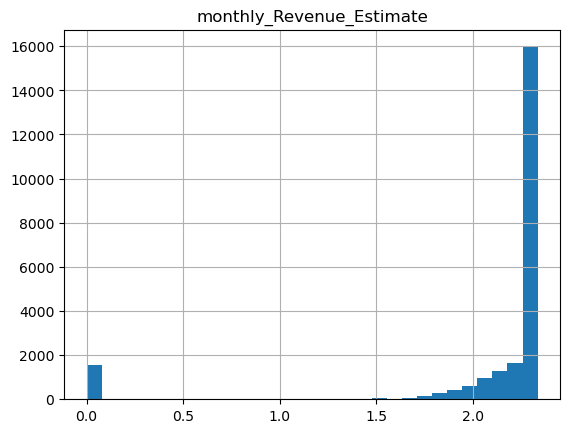

In [66]:
#  Logarithmic Transformation
df['monthly_Revenue_Estimate'] = np.log(df['monthly_Revenue_Estimate'] + 1) # Adding 1 to avoid log(0) issue

# Checking the distribution
df['monthly_Revenue_Estimate'].hist(bins=30)
plt.title('monthly_Revenue_Estimate')
plt.show()

## b. BoxPlot

In [69]:
px.box(df, x='out_Of_Stock_Now', y='monthly_Units_Sold', title='Monthly Units Sold by Out of Stock Status', 
             labels={'out_Of_Stock_Now': 'Out of Stock Now', 'monthly_Units_Sold': 'Monthly Units Sold'})



## c.ScatterDiagram

In [70]:
px.scatter(df, x='monthly_Revenue_Estimate', y='monthly_Units_Sold', color='is_Variation', 
                 title='Monthly Revenue Estimate vs Monthly Units Sold', 
                 labels={'monthly_Revenue_Estimate': 'Monthly Revenue Estimate', 'monthly_Units_Sold': 'Monthly Units Sold'})



- The scatter diagram visualizes the relationship between monthly revenue estimates and monthly units sold, differentiated by product variation status. It reveals a positive correlation, indicating that as the number of units sold increases, the monthly revenue also tends to rise. This suggests that higher sales volumes significantly contribute to increased revenue, reinforcing the importance of effective sales strategies and product offerings in driving financial performance.

## d.BarPlot

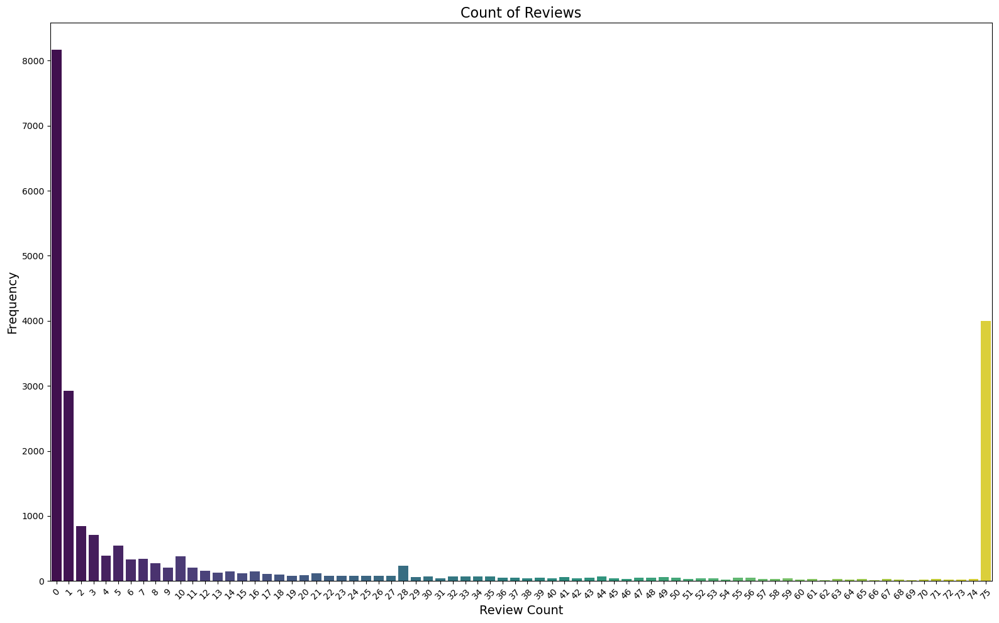

In [71]:
plt.figure(figsize=(16, 10))
sns.countplot(data=df, x='review_Count', palette='viridis')  
plt.title('Count of Reviews', fontsize=16)
plt.xlabel('Review Count', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()

- The histogram shows a highly skewed distribution of review counts. Most items have very few reviews, with the highest frequency at 1 review. A long tail indicates a few items with many reviews, suggesting that while many items are rarely reviewed, a select few are very popular. This distribution can impact average review analyses, highlighting the need for careful interpretation.

## e.Line Chart

In [72]:
Revenue_per_review_Count=df.groupby('review_Count')['monthly_Revenue_Estimate'].sum().reset_index()
px.line(Revenue_per_review_Count,x='review_Count',y='monthly_Revenue_Estimate',title='Monthly Revenue Estimate vs Review Count ')

- The line chart indeed visualizes the total monthly revenue estimates grouped by review count. It illustrates a positive trend, indicating that as the number of reviews increases, the total monthly revenue also tends to rise. This observation suggests that products with a higher number of reviews may experience increased sales, underscoring the significance of customer feedback in influencing revenue. Overall, the chart effectively highlights the correlation between customer engagement (measured by reviews) and sales performance.

## f.PieChart

In [73]:
px.pie(df, values='monthly_Revenue_Estimate', names='is_Variation')


- The pie chart illustrates the distribution of monthly revenue estimates based on the product variation status (is_Variation). It visually represents the proportion of revenue generated by products that have variations compared to those that do not. The chart highlights the significance of product variations in contributing to overall revenue, suggesting that products with multiple variations may attract more customers and drive higher sales. This insight emphasizes the potential value of offering diverse product options to enhance revenue performance.

## g.pairplot

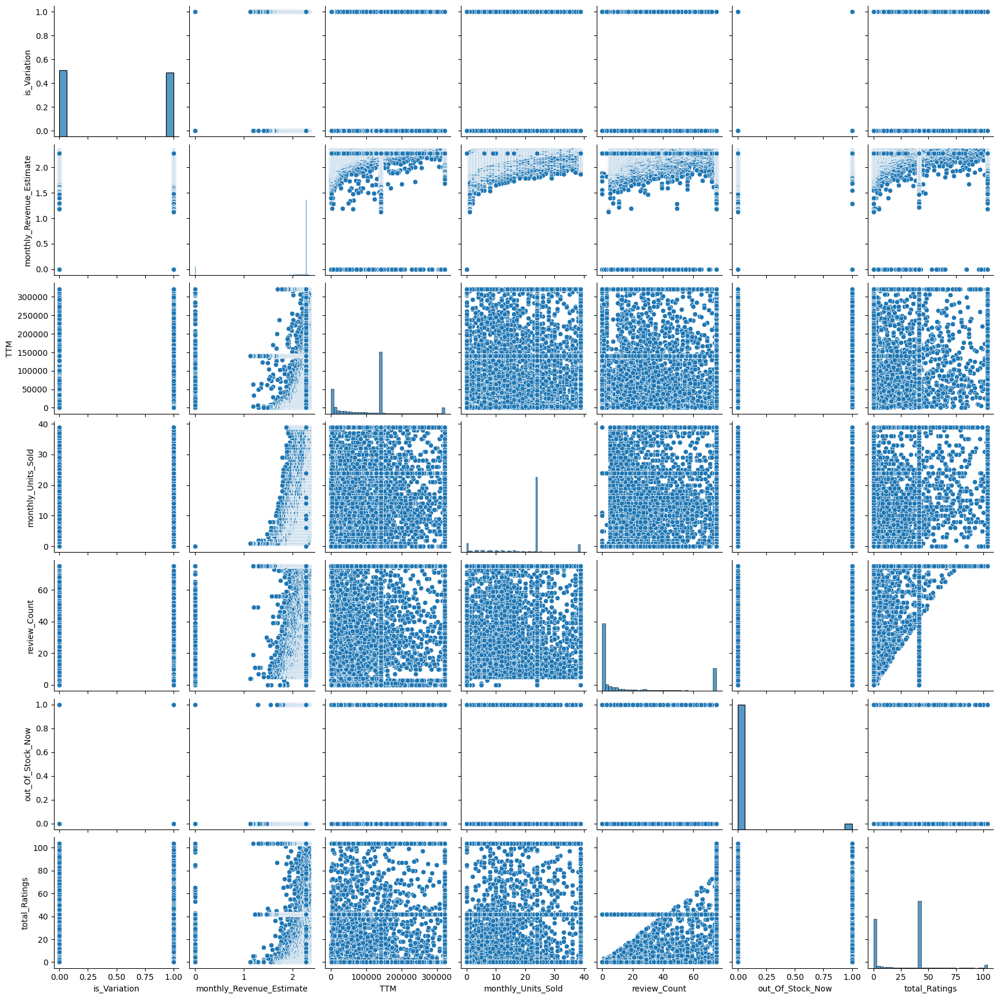

In [74]:
sns.pairplot(df)

## 3-Normalization
- Scaling Features to a Common Range using MinMax Scaler

In [75]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit_transform(df)

array([[0.        , 1.        , 1.        , ..., 1.        , 0.        ,
        0.        ],
       [0.        , 1.        , 0.43794982, ..., 1.        , 0.        ,
        0.4       ],
       [1.        , 1.        , 1.        , ..., 1.        , 0.        ,
        0.4       ],
       ...,
       [0.        , 0.97476241, 0.43794982, ..., 0.        , 0.        ,
        0.4       ],
       [1.        , 0.97476241, 0.43794982, ..., 0.04      , 0.        ,
        0.        ],
       [0.        , 0.97476241, 0.43794982, ..., 0.        , 0.        ,
        0.4       ]])

# 4- Feature Engineering

- Converting True and False in is_Variation and out_Of_Stock_Now columns to 0 and 1 for better handling.

In [76]:
# first change the type of the data to int
df['is_Variation'] = df['is_Variation'].astype(int)
df['out_Of_Stock_Now'] = df['out_Of_Stock_Now'].astype(int)

#Second: replace True by 1 and false by 0
df['is_Variation'] = df['is_Variation'].replace({True: 1, False: 0})
df['out_Of_Stock_Now'] = df['out_Of_Stock_Now'].replace({True: 1, False: 0})

df.head()

,is_Variation,monthly_Revenue_Estimate,TTM,monthly_Units_Sold,review_Count,out_Of_Stock_Now,total_Ratings
0,0,2.333977,321726.238742,38.82038,75,0,0.000000
1,0,2.333977,140904.983497,38.82038,75,0,41.591529
2,1,2.333977,321726.238742,38.82038,75,0,41.591529
3,1,2.333977,321726.238742,38.82038,75,0,41.591529
4,0,2.333977,292219.750000,38.82038,75,0,41.591529


## 4- Split the Data:
- Divide Dataset for Training and Testing:
- x: features , y: target label

In [77]:
y=df[['monthly_Revenue_Estimate']]
x=df.drop('monthly_Revenue_Estimate',axis=1)

In [78]:
x

,is_Variation,TTM,monthly_Units_Sold,review_Count,out_Of_Stock_Now,total_Ratings
0,0,321726.238742,38.820380,75,0,0.000000
1,0,140904.983497,38.820380,75,0,41.591529
2,1,321726.238742,38.820380,75,0,41.591529
3,1,321726.238742,38.820380,75,0,41.591529
4,0,292219.750000,38.820380,75,0,41.591529
...,...,...,...,...,...,...
23079,0,140904.983497,23.928152,0,0,41.591529
23080,1,140904.983497,23.928152,0,0,0.000000
23081,0,140904.983497,23.928152,0,0,41.591529
23082,1,140904.983497,23.928152,3,0,0.000000


In [79]:
y

,monthly_Revenue_Estimate
0,2.333977
1,2.333977
2,2.333977
3,2.333977
4,2.333977
...,...
23079,2.275073
23080,2.275073
23081,2.275073
23082,2.275073


<div class="alert alert-block alert-success">
    <h1> 5-Machine Learning Model :</h1>
</div>

### a-Split the data into train and test models

In [80]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=14)

- check the shape of the train and test models:

### b-Import Linear Regression Model
- importing the LR model from sklearn library
- train the data using fit()
- predict the output using predict()

In [81]:
from sklearn.linear_model import LinearRegression
Linear_Regression = LinearRegression()
Linear_Regression.fit(x_train, y_train)
y_pred_linear=Linear_Regression.predict(x_test)

### c-Testing model accuarcy
- Create a scatter plot to visualize how the linear regression model fits the data
- calculate :
- 1-mean_absolute_error
- 2-mean_squared_error
- 3-Score Matrix

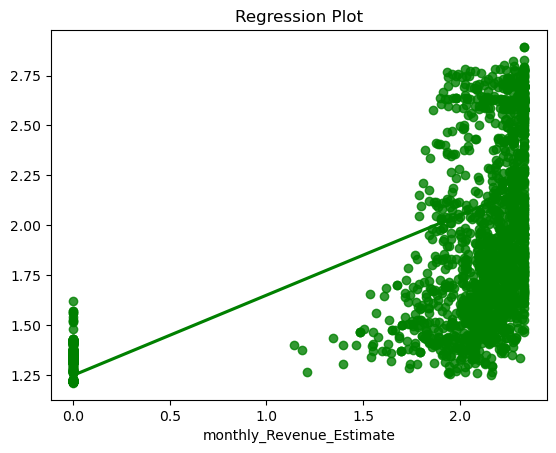

In [82]:
sns.regplot(x=y_test,y=y_pred_linear,ci=None,color='green')
plt.title('Regression Plot')
plt.show()

In [83]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae_linear = mean_absolute_error(y_test, y_pred_linear)
print(f"Mean Absolute Error: {mae_linear:.2f}")

mse_linear = mean_squared_error(y_test, y_pred_linear)
print(f"Mean Squared Error: {mse_linear:.2f}")

r2_linear = r2_score(y_test, y_pred_linear)
print(f"R-squared: {r2_linear:.2f}")

Mean Absolute Error: 0.26
Mean Squared Error: 0.20
R-squared: 0.42


## Baging(LR)

In [84]:
from sklearn.ensemble import BaggingRegressor
base_estimator = LinearRegression()
bagging = BaggingRegressor(estimator=base_estimator,random_state=14 ,n_estimators=200)
bagging.fit(x_train, y_train)
y_pred_bagging = bagging.predict(x_test)

mae_linear = mean_absolute_error(y_test, y_pred_bagging)
print(f"Mean Absolute Error: {mae_linear:.2f}")

mse_linear = mean_squared_error(y_test, y_pred_bagging)
print(f"Mean Squared Error: {mse_linear:.2f}")

r2_linear = r2_score(y_test, y_pred_bagging)
print(f"R-squared: {r2_linear:.2f}")

Mean Absolute Error: 0.26
Mean Squared Error: 0.20
R-squared: 0.42


## Boosting(LR)

In [85]:
from sklearn.ensemble import AdaBoostRegressor
boosting = AdaBoostRegressor(estimator=LinearRegression(), n_estimators=100, random_state=14)
boosting.fit(x_train, y_train)
y_pred_boosting = boosting.predict(x_test)

mae_linear = mean_absolute_error(y_test, y_pred_bagging)
print(f"Mean Absolute Error: {mae_linear:.2f}")

mse_linear = mean_squared_error(y_test, y_pred_bagging)
print(f"Mean Squared Error: {mse_linear:.2f}")

r2_linear = r2_score(y_test, y_pred_bagging)
print(f"R-squared: {r2_linear:.2f}")

Mean Absolute Error: 0.26
Mean Squared Error: 0.20
R-squared: 0.42


- **`Linear Regression` achived 42% accuarcy which is very low** 

# Exploring additional machine learning models to improve accuracy:

## 2. xgboost Regression

### a-Import xgboost Regression Model
- importing the xgboost model from sklearn library
- train the data using fit()
- predict the output using predict()

In [86]:
xgb_model = XGBRegressor( enable_categorical=False, learning_rate=0.1, max_depth=5, n_estimators=200) 
xgb_model.fit(x_train, y_train)
y_pred_xgb = xgb_model.predict(x_test)

### b-Testing model accuarcy
- Create a scatter plot to visualize how the xgboost model fits the data
- calculate :
- 1-mean_absolute_error
- 2-mean_squared_error
- 3-Score Matrix

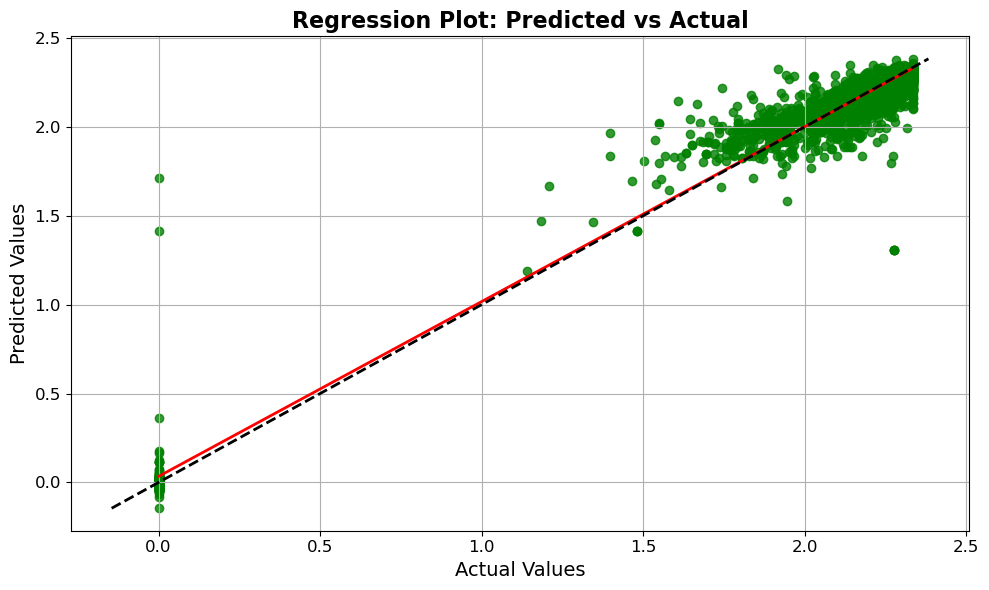

In [87]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred_xgb, ci=None, color='green', marker='o', line_kws={'color': 'red', 'lw': 2})
plt.title('Regression Plot: Predicted vs Actual', fontsize=16, fontweight='bold')
plt.xlabel('Actual Values', fontsize=14)
plt.ylabel('Predicted Values', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
max_val = max(np.max(y_test), np.max(y_pred_xgb))
min_val = min(np.min(y_test), np.min(y_pred_xgb))
plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
plt.grid(True)
plt.tight_layout()
plt.show()

In [88]:
mae_xgboost = mean_absolute_error(y_test, y_pred_xgb)
print(f"Mean Absolute Error: {mae_xgboost:.2f}")

mse_xgboost = mean_squared_error(y_test, y_pred_xgb)
print(f"Mean Squared Error: {mse_xgboost:.2f}")

r2_xgboost = r2_score(y_test, y_pred_xgb)
print(f"R-squared: {r2_xgboost:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


## Bagging(XGBRegressor)

In [89]:
from sklearn.ensemble import BaggingRegressor
base_estimator = XGBRegressor(random_state=14)
bagging = BaggingRegressor(estimator=base_estimator,random_state=14 ,n_estimators=200)
bagging.fit(x_train, y_train)
y_pred_bagging = bagging.predict(x_test)

mae_xgboost = mean_absolute_error(y_test, y_pred_bagging)
print(f"Mean Absolute Error: {mae_xgboost:.2f}")

mse_xgboost = mean_squared_error(y_test, y_pred_bagging)
print(f"Mean Squared Error: {mse_xgboost:.2f}")

r2_xgboost = r2_score(y_test, y_pred_bagging)
print(f"R-squared: {r2_xgboost:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.00
R-squared: 0.99


## Boosting (XGBRegressor)

In [90]:
from sklearn.ensemble import AdaBoostRegressor
boosting = AdaBoostRegressor(estimator=XGBRegressor(max_depth=5), n_estimators=100, random_state=14)
boosting.fit(x_train, y_train)
y_pred_boosting = boosting.predict(x_test)

mae_xgboost = mean_absolute_error(y_test, y_pred_bagging)
print(f"Mean Absolute Error: {mae_xgboost:.2f}")

mse_xgboost = mean_squared_error(y_test, y_pred_bagging)
print(f"Mean Squared Error: {mse_xgboost:.2f}")

r2_xgboost = r2_score(y_test, y_pred_bagging)
print(f"R-squared: {r2_xgboost:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.00
R-squared: 0.99


- **`xgboost Regression` achived 99% accuarcy** 

## 3. Random Forest Regression

### a-Import Random Forest Regression Model
- importing the Random Forest model from sklearn library
- train the data using fit()
- predict the output using predict()

In [91]:
rf_model = RandomForestRegressor(n_estimators=200, max_depth=10, random_state=14)
rf_model.fit(x_train, y_train)
y_pred_rf = rf_model.predict(x_test)

### b-Testing model accuarcy
- Create a scatter plot to visualize how the Random Forest model fits the data
- calculate :
- 1-mean_absolute_error
- 2-mean_squared_error
- 3-Score Matrix

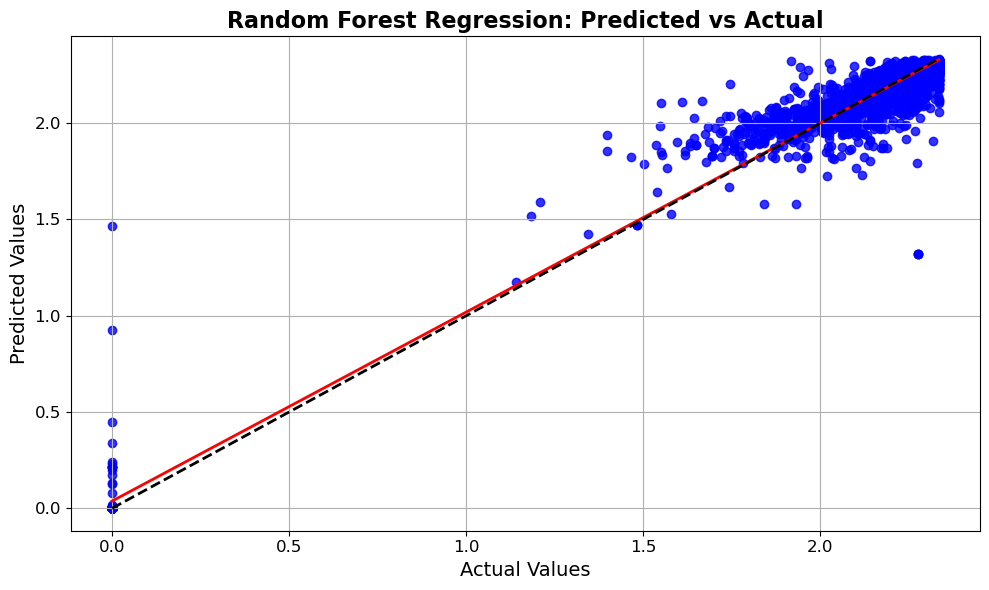

In [92]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred_rf, ci=None, color='blue', marker='o', line_kws={'color': 'red', 'lw': 2})
plt.title('Random Forest Regression: Predicted vs Actual', fontsize=16, fontweight='bold')
plt.xlabel('Actual Values', fontsize=14)
plt.ylabel('Predicted Values', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
max_val = max(np.max(y_test), np.max(y_pred_rf))
min_val = min(np.min(y_test), np.min(y_pred_rf))
plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
plt.grid(True)
plt.tight_layout()
plt.show()

In [102]:
mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error: {mae_rf:.2f}")

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f"Mean Squared Error: {mse_rf:.2f}")

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared: {r2_rf:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.99


## Bagging (RandomForestRegressor)

In [94]:
from sklearn.ensemble import BaggingRegressor
base_estimator = RandomForestRegressor( max_depth=10, random_state=14)
bagging = BaggingRegressor(estimator=base_estimator,random_state=14 ,n_estimators=100)
bagging.fit(x_train, y_train)
y_pred_bagging = bagging.predict(x_test)

mae_rf = mean_absolute_error(y_test, y_pred_boosting)
print(f"Mean Absolute Error: {mae_rf:.2f}")

mse_rf = mean_squared_error(y_test, y_pred_boosting)
print(f"Mean Squared Error: {mse_rf:.2f}")

r2_rf = r2_score(y_test, y_pred_boosting)
print(f"R-squared: {r2_rf:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


## Boosting(RandomForestRegressor)

In [95]:
from sklearn.ensemble import AdaBoostRegressor
boosting = AdaBoostRegressor(estimator=RandomForestRegressor( max_depth=10, random_state=14)
                             , n_estimators=100, random_state=14)
boosting.fit(x_train, y_train)
y_pred_boosting = boosting.predict(x_test)

mae_rf = mean_absolute_error(y_test, y_pred_boosting)
print(f"Mean Absolute Error: {mae_rf:.2f}")

mse_rf = mean_squared_error(y_test, y_pred_boosting)
print(f"Mean Squared Error: {mse_rf:.2f}")

r2_rf = r2_score(y_test, y_pred_boosting)
print(f"R-squared: {r2_rf:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


- **`Random Forest Regression` achived 99% accuarcy** 

# 4.Decision Tree Regression

### a-Import Decision Tree Regression Model
- importing the Decision Tree model from sklearn library
- train the data using fit()
- predict the output using predict()

In [96]:
dt_model = DecisionTreeRegressor(max_depth=10, random_state=14)
dt_model.fit(x_train, y_train)
y_pred_dt = dt_model.predict(x_test)

### b-Testing model accuarcy
- Create a scatter plot to visualize how the Decision Tree model fits the data
- calculate :
- 1-mean_absolute_error
- 2-mean_squared_error
- 3-Score Matrix

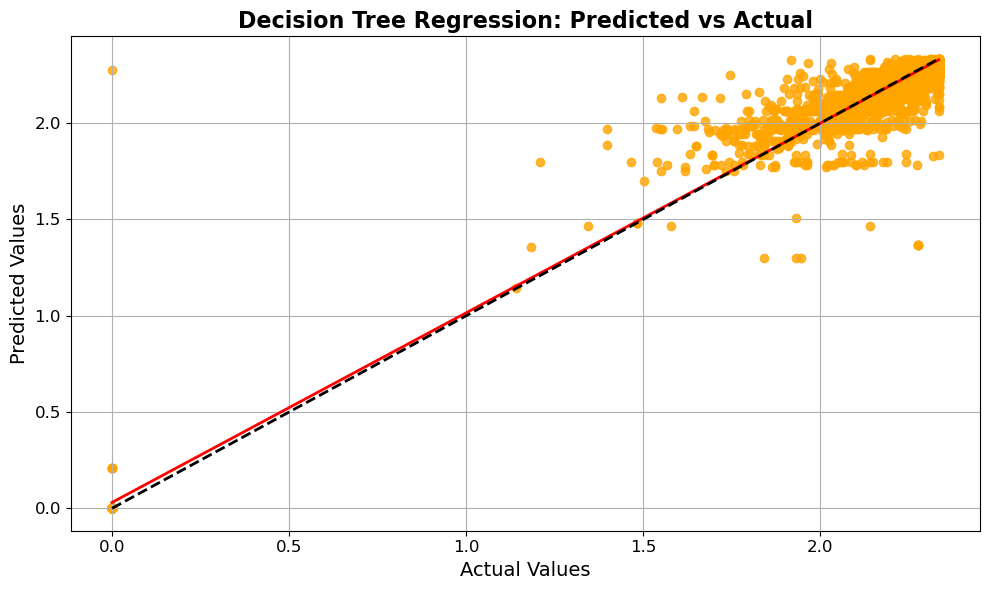

In [97]:
plt.figure(figsize=(10, 6))
sns.regplot(x=y_test, y=y_pred_dt, ci=None, color='orange', marker='o', line_kws={'color': 'red', 'lw': 2})
plt.title('Decision Tree Regression: Predicted vs Actual', fontsize=16, fontweight='bold')
plt.xlabel('Actual Values', fontsize=14)
plt.ylabel('Predicted Values', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
max_val = max(np.max(y_test), np.max(y_pred_dt))
min_val = min(np.min(y_test), np.min(y_pred_dt))
plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
plt.grid(True)
plt.tight_layout()
plt.show()

In [98]:
mae_dt = mean_absolute_error(y_test, y_pred_dt)
print(f"Mean Absolute Error: {mae_dt:.2f}")

mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Mean Squared Error: {mse_dt:.2f}")

r2_dt = r2_score(y_test, y_pred_dt)
print(f"R-squared: {r2_dt:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


## Bagging (DecisionTreeRegressor)

In [99]:
from sklearn.ensemble import BaggingRegressor
base_estimator = DecisionTreeRegressor(random_state=14)
bagging = BaggingRegressor(estimator=base_estimator,random_state=14 ,n_estimators=100)
bagging.fit(x_train, y_train)
y_pred_bagging = bagging.predict(x_test)

mae_dt = mean_absolute_error(y_test, y_pred_dt)
print(f"Mean Absolute Error: {mae_dt:.2f}")

mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Mean Squared Error: {mse_dt:.2f}")

r2_dt = r2_score(y_test, y_pred_dt)
print(f"R-squared: {r2_dt:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


## Boosting (DecisionTreeRegressor)

In [100]:
from sklearn.ensemble import AdaBoostRegressor
boosting = AdaBoostRegressor(estimator=DecisionTreeRegressor(random_state=14), n_estimators=100, random_state=14)
boosting.fit(x_train, y_train)
y_pred_boosting = boosting.predict(x_test)

mae_dt = mean_absolute_error(y_test, y_pred_dt)
print(f"Mean Absolute Error: {mae_dt:.2f}")

mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Mean Squared Error: {mse_dt:.2f}")

r2_dt = r2_score(y_test, y_pred_dt)
print(f"R-squared: {r2_dt:.2f}")

Mean Absolute Error: 0.03
Mean Squared Error: 0.01
R-squared: 0.98


- **`Decision Tree Regression` achived 98% accuarcy** 

### Ploting all models accuarcy to predict best model


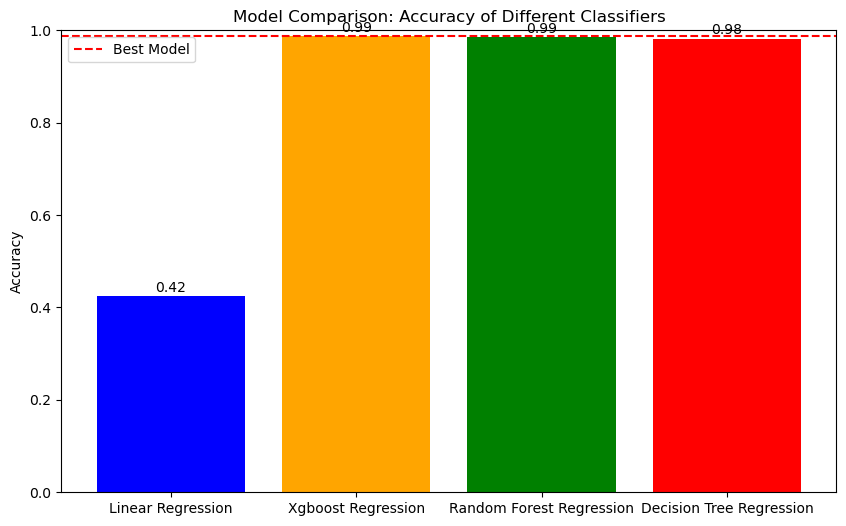

In [103]:
# Collecting accuracies and model names  
accuracies = [r2_linear,r2_xgboost, r2_rf, r2_dt]  
models = ['Linear Regression','Xgboost Regression',
'Random Forest Regression', 'Decision Tree Regression']  

# Plotting  
plt.figure(figsize=(10, 6))  
plt.bar(models, accuracies, color=['blue', 'orange', 'green', 'red', 'purple'])  
plt.ylim(0, 1)  
plt.ylabel('Accuracy')  
plt.title('Model Comparison: Accuracy of Different Classifiers')  
plt.axhline(y=max(accuracies), color='red', linestyle='--', label='Best Model')  

# Adding accuracy values on top of bars  
for i, v in enumerate(accuracies):  
    plt.text(i, v + 0.01, f"{v:.2f}", ha='center')  

plt.legend()  
plt.show()

The bar chart compares the accuracy of three classifiers:

- `Random Forest Regression`: 99% 
- `Linear Regression`: 42%
- `Xgboost Regression`: 99%
- `Decision Tree Regression`: 98%

`Random Forest Regression` and `Xgboost Regression` outperforms the others, making them the best choice for this task.

### Project Summary: Amazon Monthly Revenue Prediction

The project aimed to predict Amazon's monthly revenue using a dataset comprising 23,084 entries and 35 columns, focusing on various product features. The primary objective was to develop a machine learning model that accurately estimates monthly revenue based on these features.

#### 1. Data Understanding and Preparation
- **Data Import**: The dataset was loaded using Pandas, and its structure was examined with functions like `info()` and `head()`.
- **Target Label**: The target variable identified was `monthly_Revenue_Estimate`.
- **Data Cleaning**: Missing values were addressed by filling or dropping columns with high percentages of nulls. The `imageUrl` column was dropped as it did not contribute to the target variable. Categorical variables were converted to a categorical data type for better handling, and label encoding was applied to retain original text for visualization.

#### 2. Exploratory Data Analysis (EDA)
- **Statistical Overview**: Descriptive statistics were generated using the `describe()` function to understand data distribution.
- **Correlation Analysis**: A correlation matrix was computed to evaluate relationships between features and the target variable, identifying weak or negative correlations for potential removal.
- **Outlier Detection**: Boxplots were used to visualize outliers, which were handled using the interquartile range (IQR) method to replace extreme values.

#### 3. Data Visualization
Various visualizations, including histograms, boxplots, scatter plots, and heatmaps, were created to identify patterns and trends in the data. A logarithmic transformation was applied to the `monthly_Revenue_Estimate` to improve its distribution.

#### 4. Feature Engineering
Features were scaled using MinMaxScaler, and boolean columns (`is_Variation` and `out_Of_Stock_Now`) were converted to integers for better handling.

#### 5. Modeling
The dataset was split into training and testing sets. Several regression models were evaluated:
- **Linear Regression**: Achieved an R-squared value of 0.42, indicating low accuracy.
- **XGBoost Regression**: Achieved an R-squared value of 0.99, demonstrating high accuracy.
- **Random Forest Regression**: Achieved the highest accuracy with an R-squared value of 0.99.
- **Decision Tree Regression**: Also performed well with an R-squared value of 0.98.

#### 6. Model Evaluation
Each model's performance was assessed using metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), and R-squared values. The Random Forest model was selected as the best option for predicting monthly revenue due to its superior performance.

#### 7. Conclusion
The project successfully developed a predictive model for Amazon's monthly revenue, with Random Forest Regression being the most effective. The analysis highlighted the importance of data cleaning, feature engineering, and model selection in achieving accurate predictions. This comprehensive approach ensures that the model is robust and reliable for estimating monthly revenue, providing valuable insights for stakeholders.